# Cover Song Detection for Music Content Identification

In this tutorial, we will delve into how music content identification is done through the cover song detection method. As we know, the audio fingerprinting method is good at detecting originals, but is not robust towards variations like pitch shift, time stretching and rearrangements.

We will use open source code from the [CQTNet](https://github.com/yzspku/CQTNet/tree/master) project (credits to Zhesong Yu [@yszpku]()!) to showcase the feature extraction and cover matching process.

## Preparation

In [ ]:
import torch
from torch import nn
import torchvision
import torch.nn.functional as F
from collections import OrderedDict
import math

class CQTNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.features = nn.Sequential(OrderedDict([
            ('conv0', nn.Conv2d(1, 32, kernel_size=(12, 3), dilation=(1, 1), padding=(6, 0), bias=False)),
            ('norm0', nn.BatchNorm2d(32)), ('relu0', nn.ReLU(inplace=True)),
            ('conv1', nn.Conv2d(32, 64, kernel_size=(13, 3), dilation=(1, 2), bias=False)),
            ('norm1', nn.BatchNorm2d(64)), ('relu1', nn.ReLU(inplace=True)),
            ('pool1', nn.MaxPool2d((1, 2), stride=(1, 2), padding=(0, 1))),

            ('conv2', nn.Conv2d(64, 64, kernel_size=(13, 3), dilation=(1, 1), bias=False)),
            ('norm2', nn.BatchNorm2d(64)), ('relu2', nn.ReLU(inplace=True)),
            ('conv3', nn.Conv2d(64, 64, kernel_size=(3, 3), dilation=(1, 2), bias=False)),
            ('norm3', nn.BatchNorm2d(64)), ('relu3', nn.ReLU(inplace=True)),
            ('pool3', nn.MaxPool2d((1, 2), stride=(1, 2), padding=(0, 1))),

            ('conv4', nn.Conv2d(64, 128, kernel_size=(3, 3), dilation=(1, 1), bias=False)),
            ('norm4', nn.BatchNorm2d(128)), ('relu4', nn.ReLU(inplace=True)),
            ('conv5', nn.Conv2d(128, 128, kernel_size=(3, 3), dilation=(1, 2), bias=False)),
            ('norm5', nn.BatchNorm2d(128)), ('relu5', nn.ReLU(inplace=True)),
            ('pool5', nn.MaxPool2d((1, 2), stride=(1, 2), padding=(0, 1))),

            ('conv6', nn.Conv2d(128, 256, kernel_size=(3, 3), dilation=(1, 1), bias=False)),
            ('norm6', nn.BatchNorm2d(256)), ('relu6', nn.ReLU(inplace=True)),
            ('conv7', nn.Conv2d(256, 256, kernel_size=(3, 3), dilation=(1, 2), bias=False)),
            ('norm7', nn.BatchNorm2d(256)), ('relu7', nn.ReLU(inplace=True)),
            ('pool7', nn.MaxPool2d((1, 2), stride=(1, 2), padding=(0, 1))),

            ('conv8', nn.Conv2d(256, 512, kernel_size=(3, 3), dilation=(1, 1), bias=False)),
            ('norm8', nn.BatchNorm2d(512)), ('relu8', nn.ReLU(inplace=True)),
            ('conv9', nn.Conv2d(512, 512, kernel_size=(3, 3), dilation=(1, 2), bias=False)),
            ('norm9', nn.BatchNorm2d(512)), ('relu9', nn.ReLU(inplace=True)),
        ]))
        self.pool = nn.AdaptiveMaxPool2d((1, 1))
        self.fc0 = nn.Linear(512, 300)
        self.fc1 = nn.Linear(300, 10000)

    def forward(self, x):
        # input [N, C, H, W] (W = 396)
        N = x.size()[0]
        x = self.features(x)  # [N, 512, 57, 2~15]
        x = self.pool(x)
        x = x.view(N, -1)
        feature = self.fc0(x)
        x = self.fc1(feature)
        return x, feature

In [ ]:
import librosa
import numpy as np
import os

import matplotlib.pyplot as plt

def get_cqt(in_path):
    data, sr = librosa.load(in_path)
    cqt = np.abs(librosa.cqt(y=data, sr=sr))
    mean_size = 20
    height, length = cqt.shape

    # downsample cqt time resolution
    new_cqt = np.zeros((height,int(length/mean_size)),dtype=np.float64)
    for i in range(int(length/mean_size)):
        new_cqt[:,i] = cqt[:,i*mean_size:(i+1)*mean_size].mean(axis=1)

    return new_cqt

In [ ]:
import torch
from sklearn.metrics.pairwise import pairwise_distances


model = CQTNet()
model.load_state_dict(torch.load("sample_data/CQTNet_SpecAugment_x3.pth"))


def get_feature_vector(fname):
  new_cqt = get_cqt(fname)

  # preprocess
  new_cqt = new_cqt.T
  new_cqt = new_cqt.astype(np.float32) / (np.max(np.abs(new_cqt))+ 1e-6)
  new_cqt = torch.tensor(new_cqt).permute(1,0).unsqueeze(0).unsqueeze(0)

  # model
  with torch.no_grad():
    score, feature = model(new_cqt)

  return feature


def match_vectors(query_vector, db_vector, song_names):
  distances = pairwise_distances(query_vector, db_vector, metric='cosine').squeeze()
  mydata = []
  head = ["Song", "Score"]

  for idx in np.argsort(distances).squeeze():
    mydata.append([song_names[idx].split("/")[-1].split(".")[0], distances[idx]])

  from tabulate import tabulate
  print(tabulate(mydata, headers=head, tablefmt="grid"))

<ipython-input-9-0dc402d4e768>:6: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load("sample_data/CQTNet_SpecAugment_x3.pth"))


## Main Function

In [ ]:
# get db vectors
db_vector = []
song_names = [
    "sample_data/Sam Smith - I'm Not The Only One.mp3",
    "sample_data/Taylor Swift - Our Song.mp3",
    "sample_data/Ed Sheeran - Shape Of You.mp3"
]

for fname in song_names:
  vector = get_feature_vector(fname).cpu().numpy()
  db_vector.append(vector)

db_vector = np.concatenate(db_vector)

print(db_vector.shape)

(3, 300)


In [ ]:
# get query vectors
query_vector = get_feature_vector("sample_data/Boyce Avenue - I'm Not The Only One.mp3").cpu().numpy()

In [ ]:
# show query song
import IPython.display as ipd
ipd.display(ipd.Audio("sample_data/Boyce Avenue - I'm Not The Only One.mp3"))

In [ ]:
# matching
match_vectors(query_vector, db_vector, song_names)

+----------------------------------+----------+
| Song                             |    Score |
+==================================+==========+
| Sam Smith - I'm Not The Only One | 0.286473 |
+----------------------------------+----------+
| Taylor Swift - Our Song          | 0.668606 |
+----------------------------------+----------+
| Ed Sheeran - Shape Of You        | 0.74045  |
+----------------------------------+----------+


In [ ]:
# get query vectors
query_vector = get_feature_vector("sample_data/Our Song  Taylor Swift (cover).mp3").cpu().numpy()

In [ ]:
# show query song
import IPython.display as ipd
ipd.display(ipd.Audio("sample_data/Our Song  Taylor Swift (cover).mp3"))

In [ ]:
# matching
match_vectors(query_vector, db_vector, song_names)

+----------------------------------+----------+
| Song                             |    Score |
+==================================+==========+
| Taylor Swift - Our Song          | 0.382805 |
+----------------------------------+----------+
| Sam Smith - I'm Not The Only One | 0.667142 |
+----------------------------------+----------+
| Ed Sheeran - Shape Of You        | 0.812454 |
+----------------------------------+----------+


## Why does this work?

Have a look below at the CQT of a cover and an original. Even though the pitch is shifted (transposed key) and the instrumentation is different, we can still see very similar melody contours.

The CQTNet is trained to output a feature vector (embedding) that groups songs with similar melody contour closer.

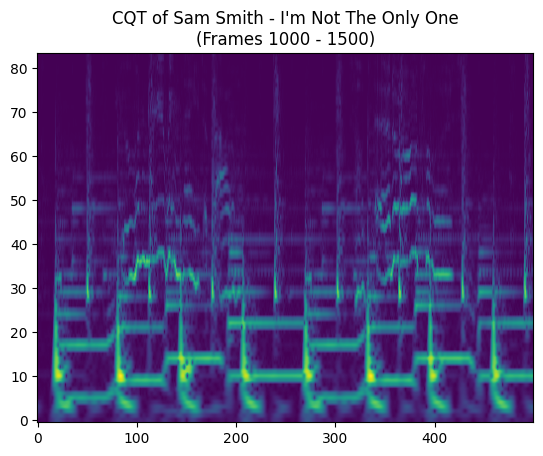

In [ ]:
data, sr = librosa.load("sample_data/Sam Smith - I'm Not The Only One.mp3")
cqt = np.abs(librosa.cqt(y=data, sr=sr))

plt.imshow(np.log1p(cqt)[:, 1000:1500], aspect="auto", origin='lower')
plt.title("CQT of Sam Smith - I'm Not The Only One\n(Frames 1000 - 1500)")
plt.show()

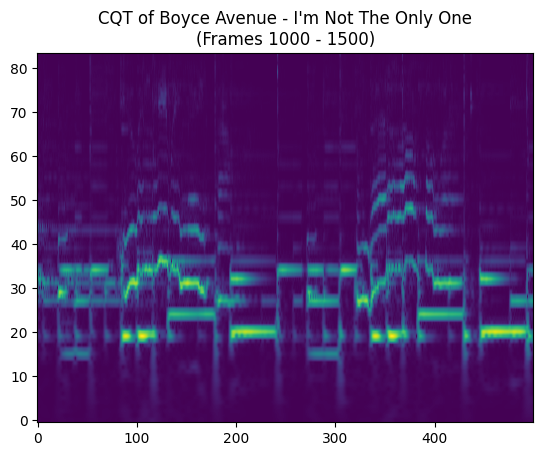

In [ ]:
data, sr = librosa.load("sample_data/Boyce Avenue - I'm Not The Only One.mp3")
cqt = np.abs(librosa.cqt(y=data, sr=sr))

plt.imshow(np.log1p(cqt)[:, 1000:1500], aspect="auto", origin='lower')
plt.title("CQT of Boyce Avenue - I'm Not The Only One\n(Frames 1000 - 1500)")
plt.show()